# Function to run inferCNV and save results in a new AnnData object

In [1]:
import numpy as np
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings

# Suppress warnings to avoid cluttered output
warnings.simplefilter("ignore")

# Set default figure parameters for plotting
sc.settings.set_figure_params(figsize=(5, 5))

def inferCNV_for_simulated_data(path, data_name, window_size):
    """
    Perform CNV (Copy Number Variation) inference on a simulated dataset using infercnvpy.

    Parameters:
    - path (str): The directory path where the dataset is stored.
    - data_name (str): The name of the dataset (without file extension).
    - window_size (int): The size of the genomic window for CNV inference.
    - step (int): The step size for sliding window CNV calculation.

    Outputs:
    - Saves CNV heatmap and UMAP visualizations.
    - Saves the processed AnnData object with inferred CNVs.
    """

    # Load the dataset from the specified path
    adata = sc.read_h5ad(path + '/' + data_name + '.h5ad')
    
    # Extract the simulated CNV layer and assign it to the main matrix (X)
    layer = 'CNV_simulated'
    adata.X = adata.layers[layer].copy()

    # Perform CNV inference using infercnvpy
    cnv.tl.infercnv(
        adata,
        reference_key="cell_type",  # Column in adata.obs containing reference cell types
        reference_cat=['ciliated cell', 'basal cell'],  # List of reference cell types
        window_size=window_size,
        step=1,
        calculate_gene_values=True,  # Compute CNV values for genes
    )

    # Perform dimensionality reduction and clustering
    cnv.tl.pca(adata)  # Compute PCA for feature reduction
    cnv.pp.neighbors(adata)  # Compute nearest neighbors graph
    cnv.tl.leiden(adata)  # Perform clustering using the Leiden algorithm

    # Adjust clustering resolution until exactly four clusters are obtained
    resol = 0.7
    cnv.tl.leiden(adata, resolution=resol, key_added='cnv_leiden')

    while len(np.unique(adata.obs['cnv_leiden'])) != 4:
        print('Adjusting the resolution of the clustering...')
        
        if len(np.unique(adata.obs['cnv_leiden'])) < 4:
            resol += 0.005  # Increase resolution if there are fewer than 4 clusters
            print(f'Increasing resolution to {resol}')
        elif len(np.unique(adata.obs['cnv_leiden'])) > 4:
            resol -= 0.005  # Decrease resolution if there are more than 4 clusters
            print(f'Reducing resolution to {resol}')

        cnv.tl.leiden(adata, resolution=resol, key_added='cnv_leiden')

    # Store final clustering results with the adjusted resolution
    cnv.tl.leiden(adata, resolution=resol, key_added=f'cnv_leiden_res{round(resol, 2)}')

    # Generate and save a CNV heatmap
    cnv.pl.chromosome_heatmap(
        adata,
        groupby="cnv_leiden",  # Group cells by inferred CNV clusters
        dendrogram=False,  # Do not plot a dendrogram
        vmin=-0.4, vmax=0.4,  # Set color range for CNV values
        save=f'_{data_name}.png'
    )
    print('CNV heatmap saved!')

    # Compute and save UMAP visualizations
    cnv.tl.umap(adata)  # Compute UMAP embedding
    cnv.tl.cnv_score(adata, groupby='cnv_leiden')  # Compute CNV scores per cluster

    cnv.pl.umap(
        adata,
        color=['simulated_subclone', 'cnv_leiden', 'cnv_score'],  # Colors for UMAP plots
        save=f'_{data_name}.png'
    )
    print('CNV UMAP saved!')

    # Save the processed AnnData object with inferred CNVs
    new_path = path + '/' + data_name + '_CNVinf.h5ad'
    adata.write(new_path, compression='gzip')

    print(f'CNV inference for the {data_name} dataset has been completed. The results have been saved in: {new_path}')

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Run inferCNV for each combination  

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [25:18<00:00, 1518.22s/it]


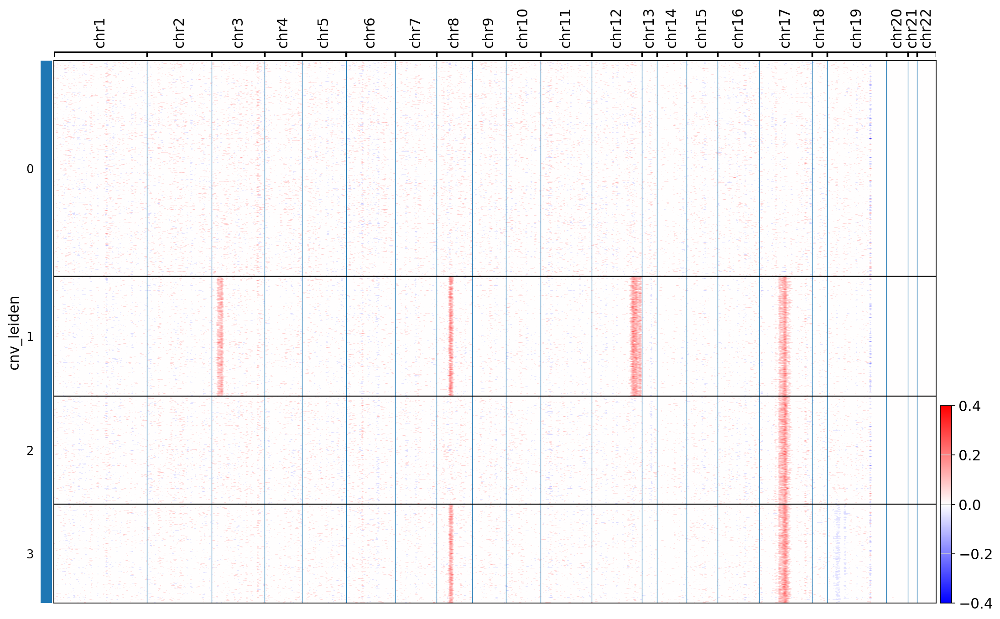

CNV heatmap saved!


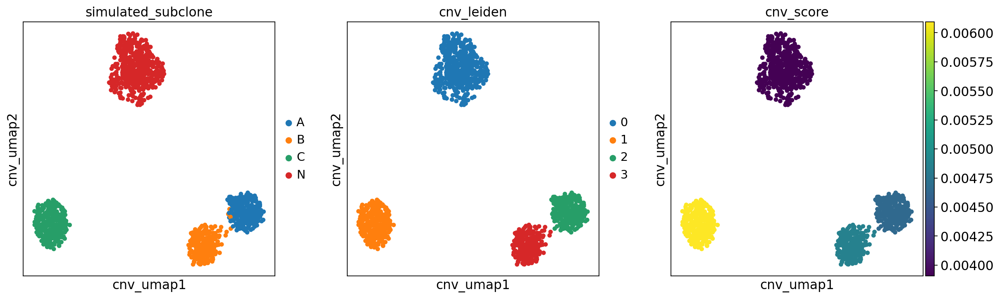

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_all dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_all_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [15:14<00:00, 914.96s/it]


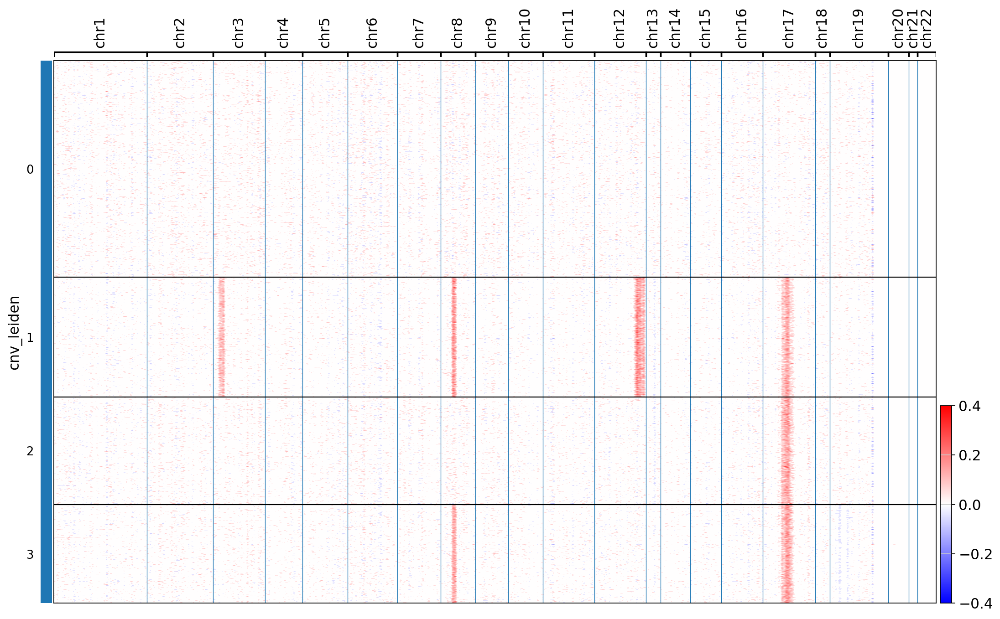

CNV heatmap saved!


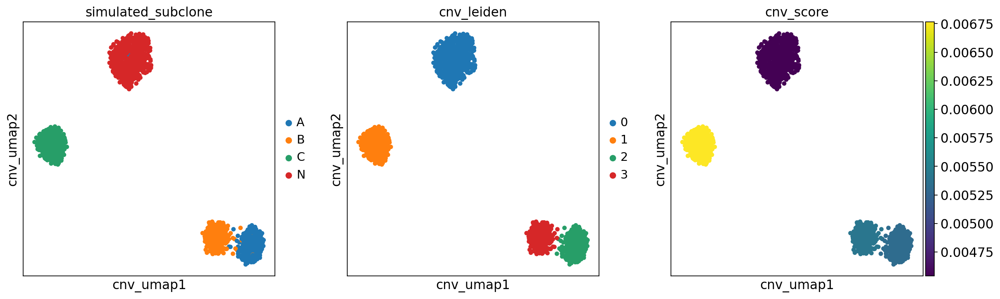

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_20000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_20000_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [09:16<00:00, 556.45s/it]


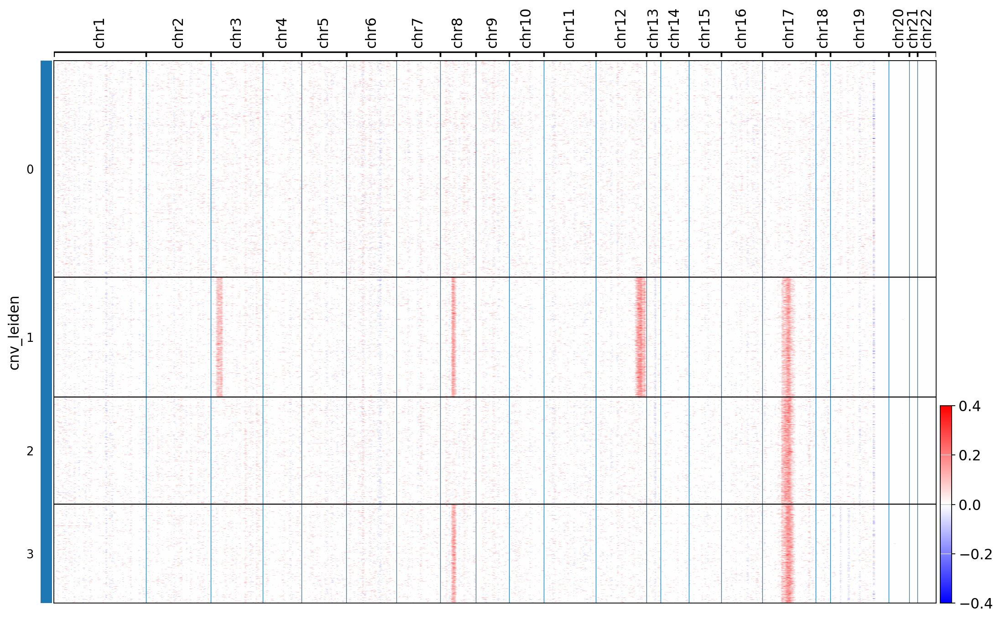

CNV heatmap saved!


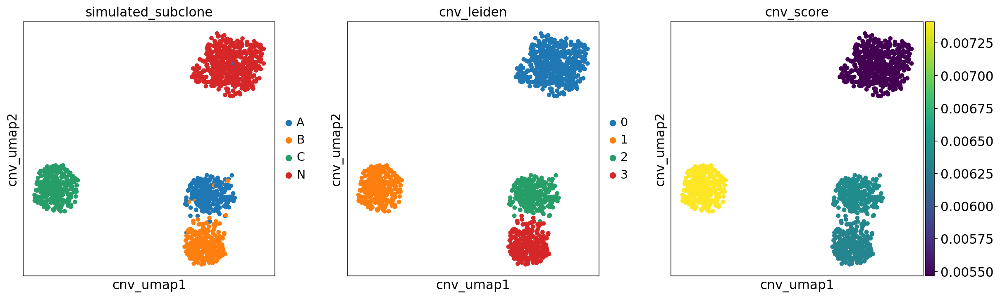

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_15000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_15000_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [04:18<00:00, 258.35s/it]


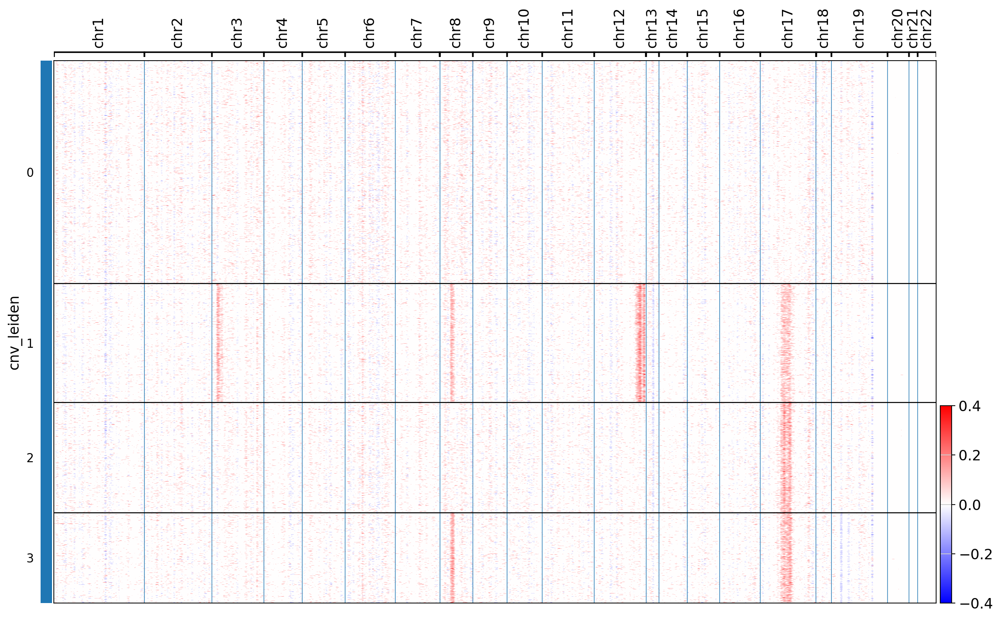

CNV heatmap saved!


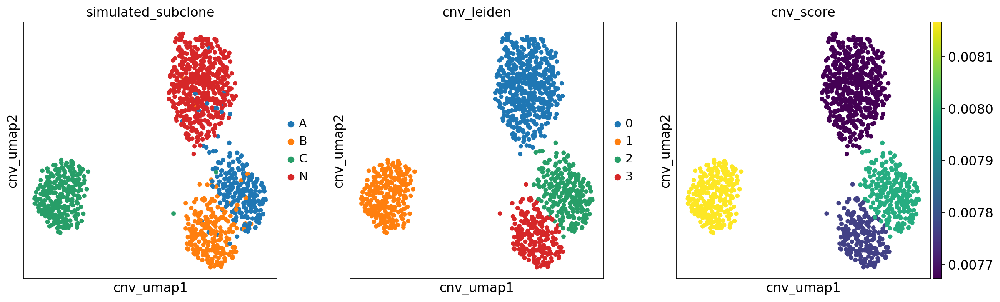

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_10000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_10000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:27<00:00, 87.94s/it]


Adjusting the resolution of the clustering...
Increasing resolution to 0.705
Adjusting the resolution of the clustering...
Increasing resolution to 0.71
Adjusting the resolution of the clustering...
Increasing resolution to 0.715
Adjusting the resolution of the clustering...
Increasing resolution to 0.72
Adjusting the resolution of the clustering...
Increasing resolution to 0.725


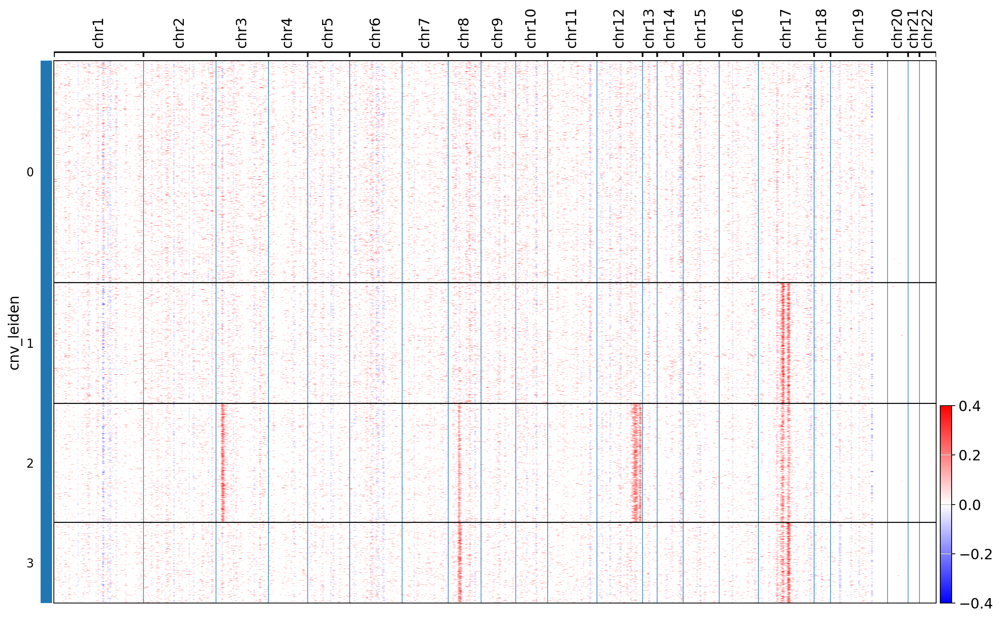

CNV heatmap saved!


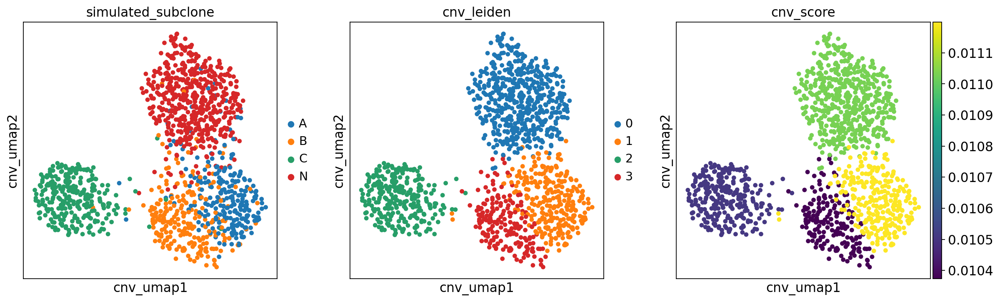

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_5000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_5000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:11<00:00, 11.64s/it]


Adjusting the resolution of the clustering...
Reducing resolution to 0.695
Adjusting the resolution of the clustering...
Reducing resolution to 0.69
Adjusting the resolution of the clustering...
Reducing resolution to 0.6849999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6799999999999999


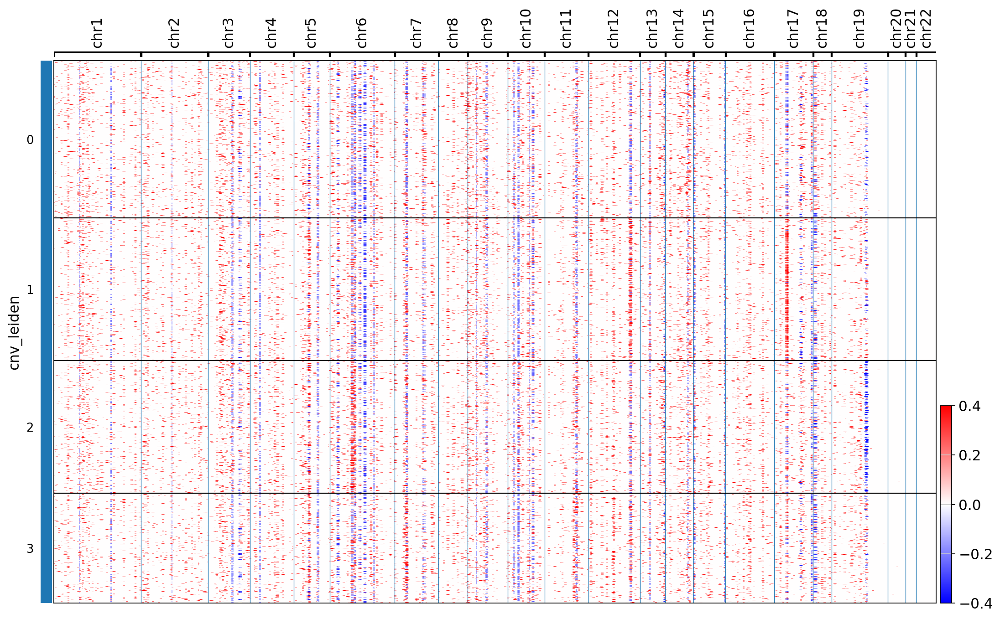

CNV heatmap saved!


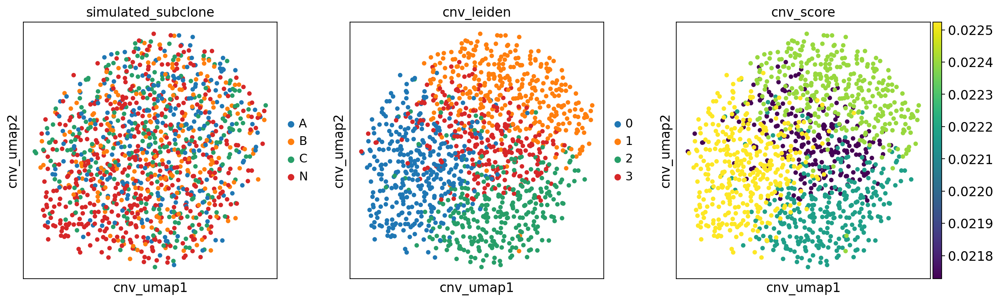

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_1000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_1000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.94s/it]


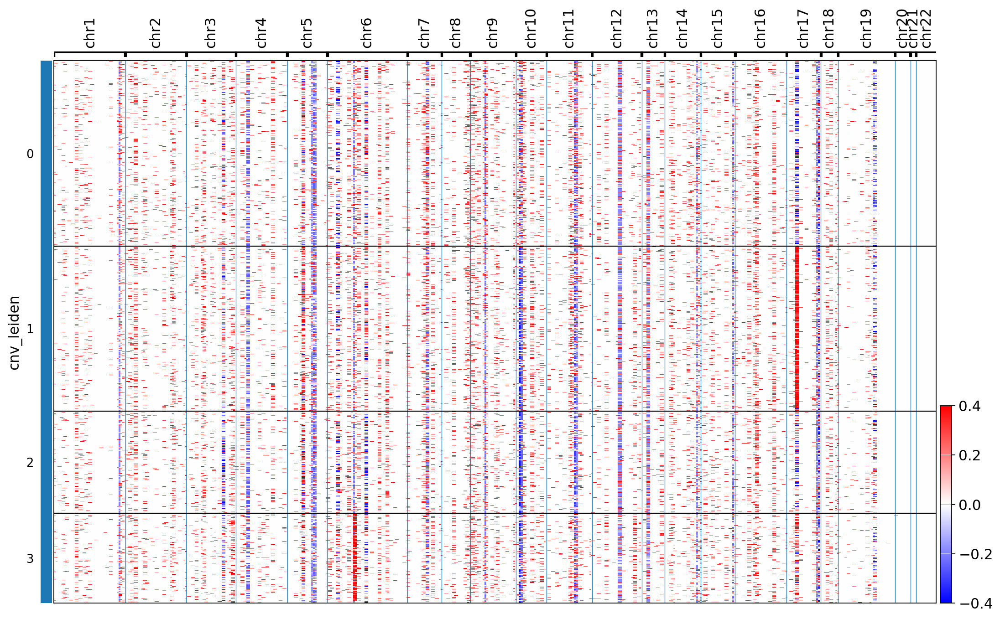

CNV heatmap saved!


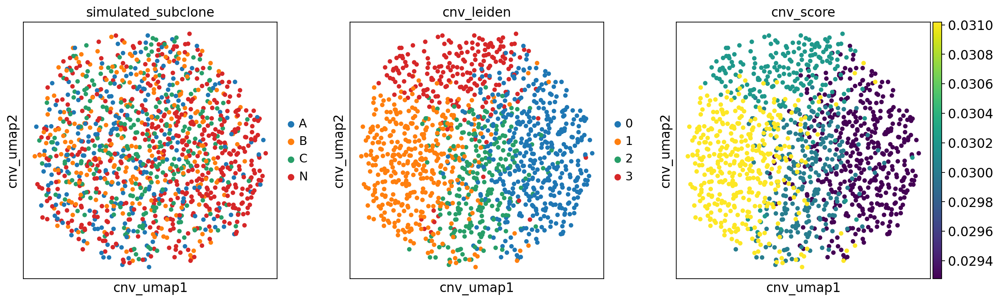

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_10_genes_500 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_10_genes_500_CNVinf.h5ad


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [25:37<00:00, 1537.17s/it]


Adjusting the resolution of the clustering...
Reducing resolution to 0.695
Adjusting the resolution of the clustering...
Reducing resolution to 0.69
Adjusting the resolution of the clustering...
Reducing resolution to 0.6849999999999999


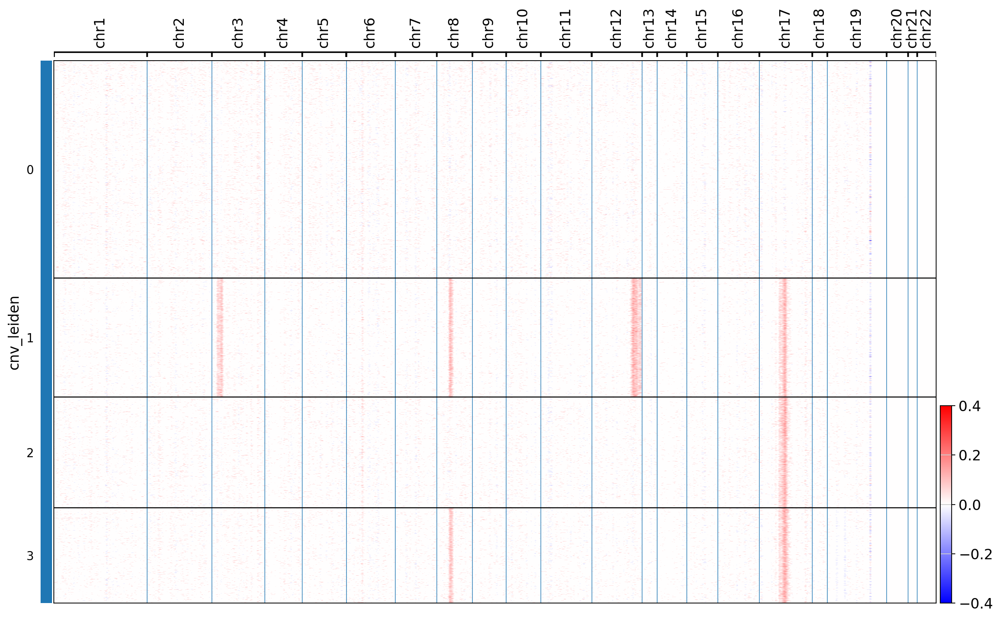

CNV heatmap saved!


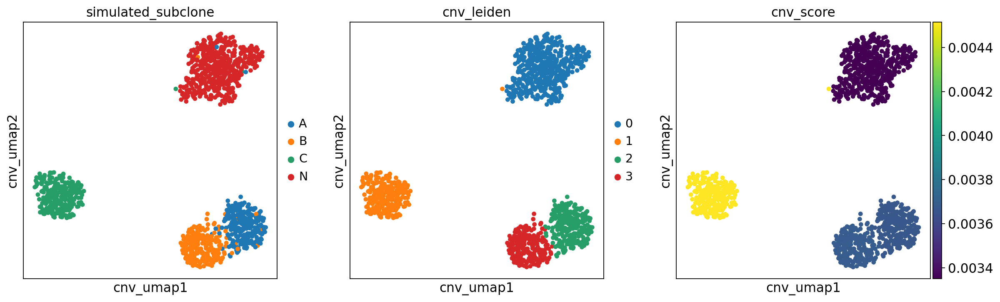

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_all dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_all_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [16:09<00:00, 969.83s/it]


Adjusting the resolution of the clustering...
Reducing resolution to 0.695
Adjusting the resolution of the clustering...
Reducing resolution to 0.69


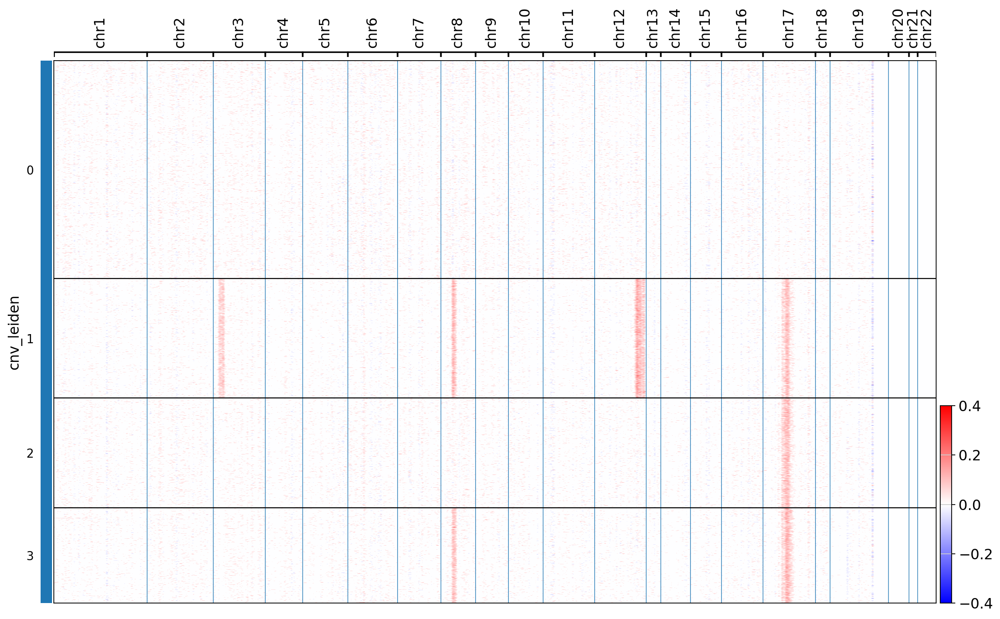

CNV heatmap saved!


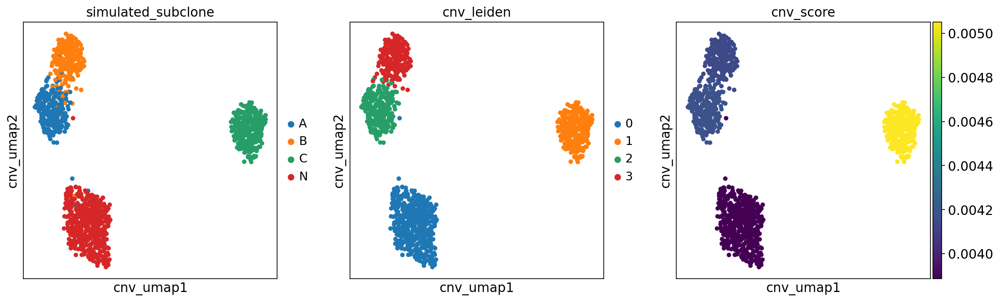

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_20000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_20000_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [08:44<00:00, 524.02s/it]


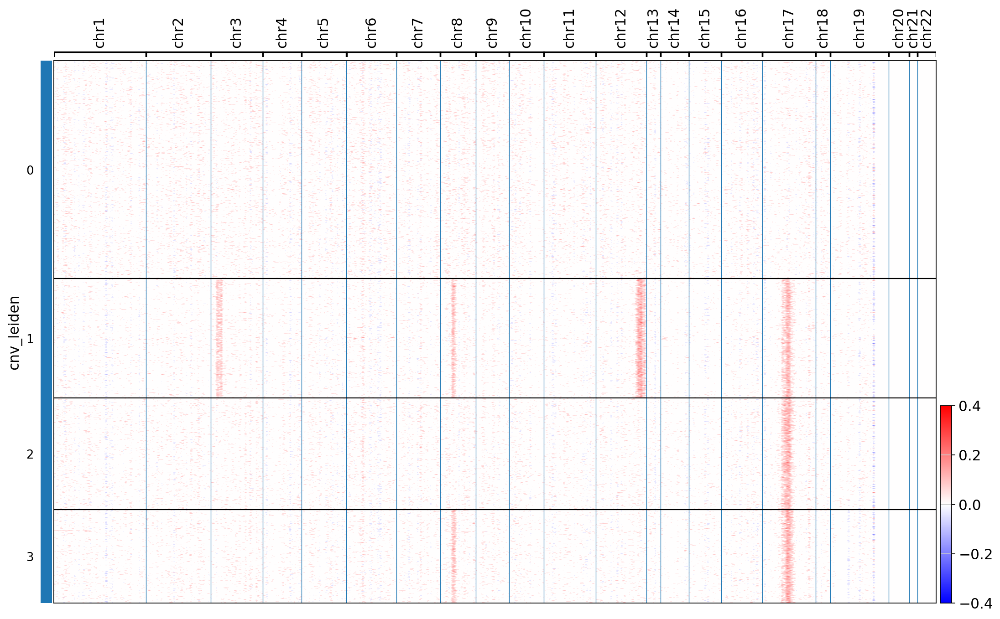

CNV heatmap saved!


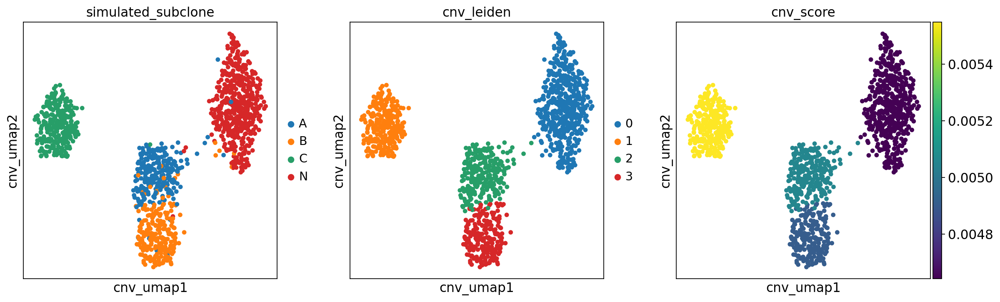

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_15000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_15000_CNVinf.h5ad


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [04:03<00:00, 243.27s/it]


Adjusting the resolution of the clustering...
Increasing resolution to 0.705
Adjusting the resolution of the clustering...
Increasing resolution to 0.71
Adjusting the resolution of the clustering...
Increasing resolution to 0.715
Adjusting the resolution of the clustering...
Increasing resolution to 0.72
Adjusting the resolution of the clustering...
Increasing resolution to 0.725
Adjusting the resolution of the clustering...
Increasing resolution to 0.73
Adjusting the resolution of the clustering...
Increasing resolution to 0.735
Adjusting the resolution of the clustering...
Increasing resolution to 0.74
Adjusting the resolution of the clustering...
Increasing resolution to 0.745
Adjusting the resolution of the clustering...
Increasing resolution to 0.75
Adjusting the resolution of the clustering...
Increasing resolution to 0.755
Adjusting the resolution of the clustering...
Increasing resolution to 0.76
Adjusting the resolution of the clustering...
Increasing resolution to 0.765
Adjus

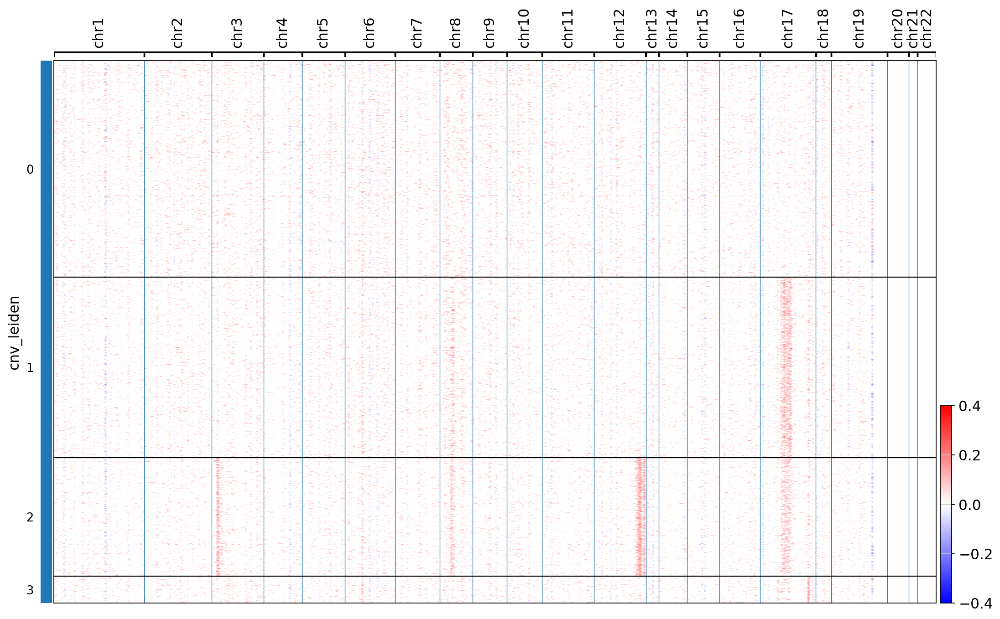

CNV heatmap saved!


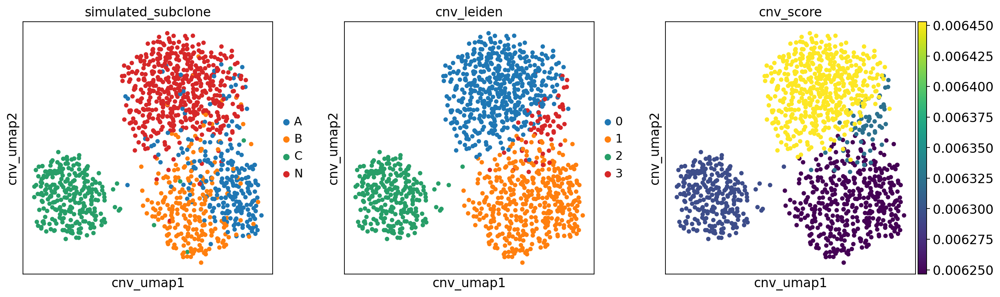

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_10000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_10000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:22<00:00, 82.34s/it]


Adjusting the resolution of the clustering...
Increasing resolution to 0.705
Adjusting the resolution of the clustering...
Increasing resolution to 0.71
Adjusting the resolution of the clustering...
Increasing resolution to 0.715
Adjusting the resolution of the clustering...
Increasing resolution to 0.72
Adjusting the resolution of the clustering...
Increasing resolution to 0.725
Adjusting the resolution of the clustering...
Increasing resolution to 0.73
Adjusting the resolution of the clustering...
Increasing resolution to 0.735
Adjusting the resolution of the clustering...
Increasing resolution to 0.74
Adjusting the resolution of the clustering...
Increasing resolution to 0.745
Adjusting the resolution of the clustering...
Increasing resolution to 0.75
Adjusting the resolution of the clustering...
Increasing resolution to 0.755
Adjusting the resolution of the clustering...
Increasing resolution to 0.76
Adjusting the resolution of the clustering...
Increasing resolution to 0.765
Adjus

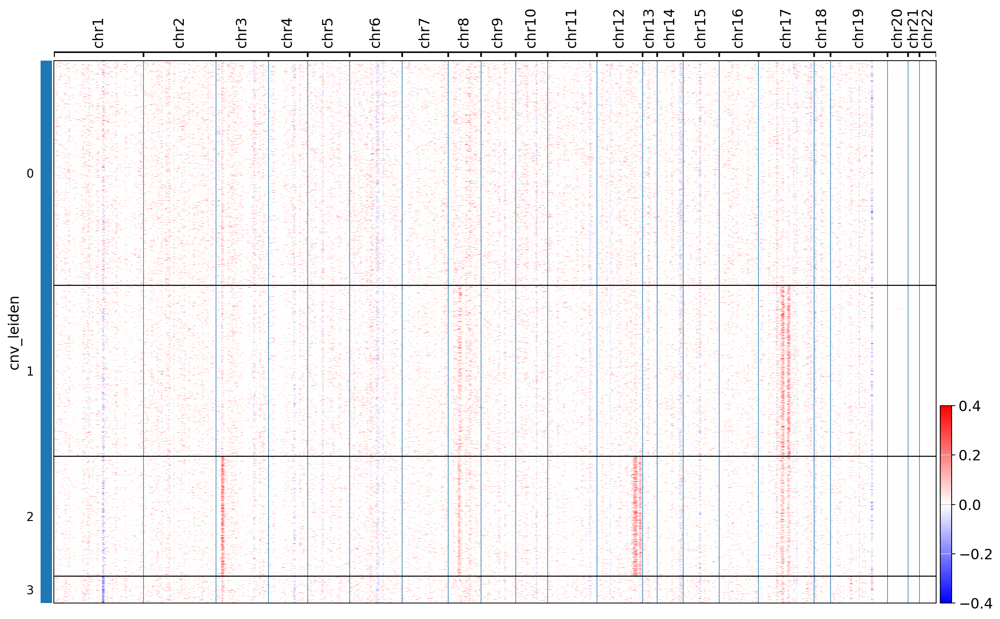

CNV heatmap saved!


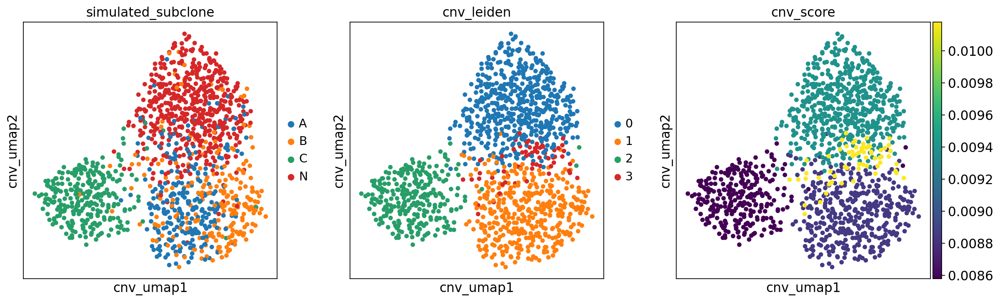

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_5000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_5000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00, 10.84s/it]


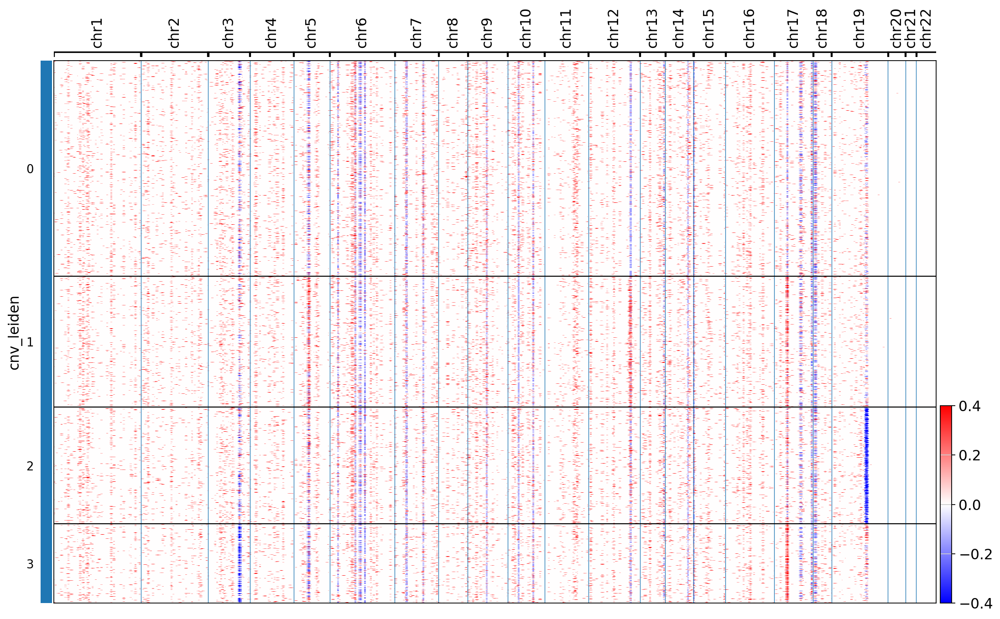

CNV heatmap saved!


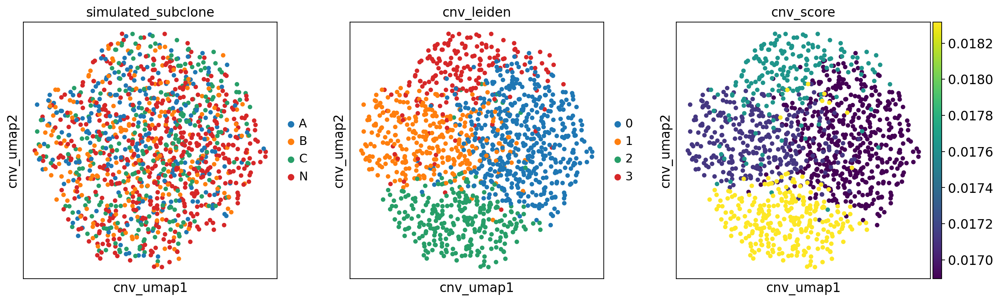

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_1000 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_1000_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.35s/it]


Adjusting the resolution of the clustering...
Reducing resolution to 0.695
Adjusting the resolution of the clustering...
Reducing resolution to 0.69
Adjusting the resolution of the clustering...
Reducing resolution to 0.6849999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6799999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6749999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6699999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6649999999999999
Adjusting the resolution of the clustering...
Reducing resolution to 0.6599999999999999


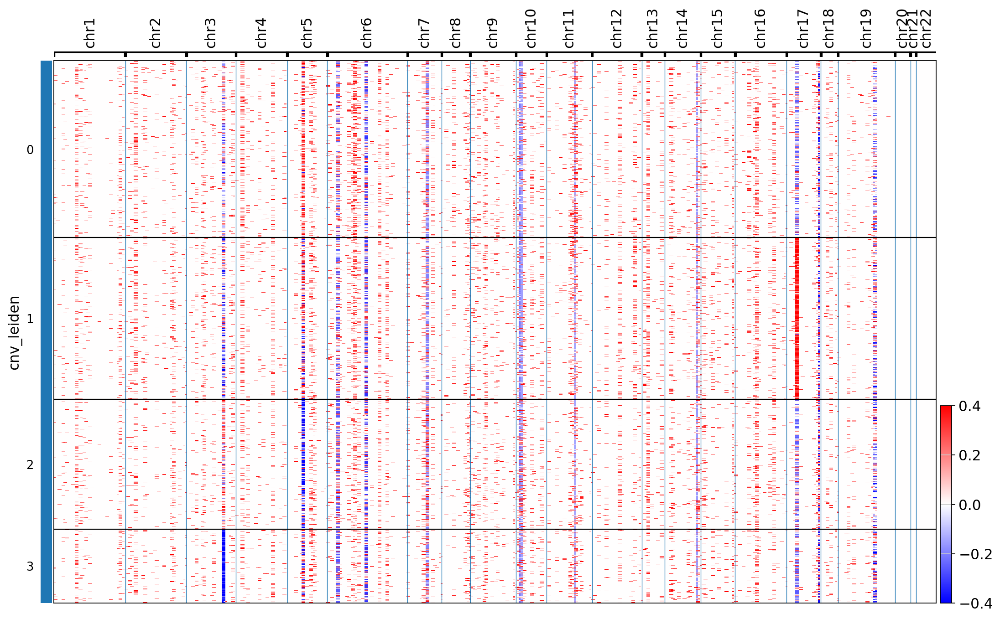

CNV heatmap saved!


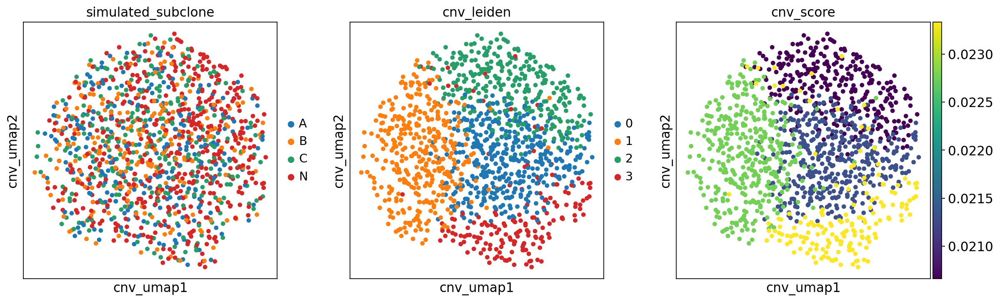

CNV UMAP saved!
CNV inference for the CNV_simulation_03_subsampled_counts_5_genes_500 dataset has been completed. The results have been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulation_03_subsampled_counts_5_genes_500_CNVinf.h5ad


  0%|                                                                                                        | 0/1 [00:00<?, ?it/s]

In [ ]:
folder = '/home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions'


fractions = [100,70,50,20,10,5,3,2,1]

gene_panel_size = ['all', 20000,15000,10000,5000,1000,500]
window_sizes = [100,80,60,40,20,4,2]

for frac in fractions[4:9]:
    for gen, win in zip(gene_panel_size, window_sizes):
        name = f'CNV_simulation_03_subsampled_counts_{frac}_genes_{gen}'
        inferCNV_for_simulated_data(path=folder, data_name=name, window_size=win)